In [ ]:
!git clone https://github.com/Aiman-Malik553/Python-Internship.git
print("Repo cloned!")

Cloning into 'Python-Internship'...
remote: Enumerating objects: 82, done.
remote: Counting objects: 100% (82/82), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 82 (delta 22), reused 60 (delta 5), pack-reused 0 (from 0)
Receiving objects: 100% (82/82), 20.60 MiB | 17.18 MiB/s, done.
Resolving deltas: 100% (22/22), done.
Repo cloned!


In [ ]:
import json
import os

curated_json_path = "Python-Internship/Week3/data/xai_examples/curated_examples.json"
curated_images_folder = "Python-Internship/Week3/data/xai_examples/images"

with open(curated_json_path, "r") as f:
    curated_examples = json.load(f)

print(f"Loaded {len(curated_examples)} curated examples")
for ex in curated_examples[:3]:
    print(f"{ex['image']} ({ex['quality_label']}): {ex['blip_caption']}")

Loaded 15 curated examples
2931254547_e97c6d0d63.jpg (good): a crowd of people
226531363_33ac01d931.jpg (good): a dog running in the snow on a sunny day
3678098428_40c1b74cc2.jpg (good): a man wearing a black tank top


In [ ]:
!pip install -q transformers accelerate pillow captum

import torch
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)
model.eval()

print("BLIP model loaded! Captum installed!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.2/455.2 kB 32.0 MB/s eta 0:00:00


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

pytorch_model.bin: reconstructing file:   0%|          |  0.00B /  990MB            

pytorch_model.bin: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/473 [00:00<?, ?it/s]

BLIP model loaded! Captum installed!


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Test ke liye pehli curated image lete hain
test_example = curated_examples[0]
test_img_path = os.path.join(curated_images_folder, test_example["image"])
test_image = Image.open(test_img_path).convert("RGB")

# Image ko process karein
inputs = processor(test_image, return_tensors="pt").to(device)

# Model se attentions nikalna (vision encoder ke)
with torch.no_grad():
    vision_outputs = model.vision_model(
        pixel_values=inputs["pixel_values"],
        output_attentions=True
    )

# Last layer ki attention lein
attentions = vision_outputs.attentions[-1]  # shape: (batch, heads, tokens, tokens)
print("Attention shape:", attentions.shape)
print("Test image:", test_example["image"])
print("Caption:", test_example["blip_caption"])

Attention shape: torch.Size([1, 12, 577, 577])
Test image: 2931254547_e97c6d0d63.jpg
Caption: a crowd of people


Grid size: 24x24, total patches: 576


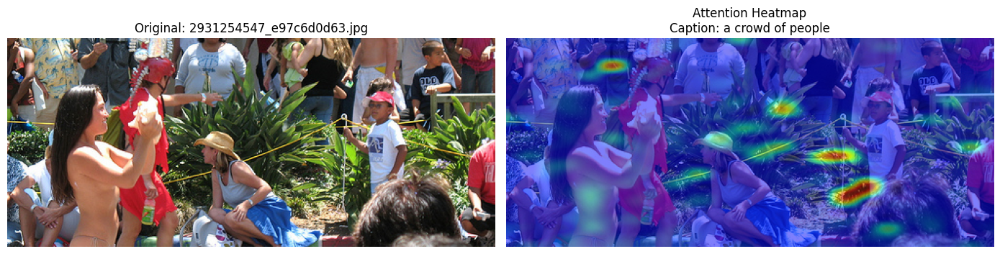

In [ ]:
attn = attentions[0].mean(dim=0)
cls_attn = attn[0, 1:]

num_patches = cls_attn.shape[0]
grid_size = int(np.sqrt(num_patches))

cls_attn_grid = cls_attn.reshape(grid_size, grid_size).cpu().numpy()

print(f"Grid size: {grid_size}x{grid_size}, total patches: {num_patches}")

from scipy.ndimage import zoom
heatmap_resized = zoom(cls_attn_grid, (test_image.height / grid_size, test_image.width / grid_size))

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(test_image)
axes[0].set_title(f"Original: {test_example['image']}")
axes[0].axis("off")

axes[1].imshow(test_image)
axes[1].imshow(heatmap_resized, cmap='jet', alpha=0.5)
axes[1].set_title(f"Attention Heatmap\nCaption: {test_example['blip_caption']}")
axes[1].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
def get_attention_heatmap(image, model, processor, device):
    inputs = processor(image, return_tensors="pt").to(device)

    with torch.no_grad():
        vision_outputs = model.vision_model(
            pixel_values=inputs["pixel_values"],
            output_attentions=True
        )

    attentions = vision_outputs.attentions[-1]
    attn = attentions[0].mean(dim=0)
    cls_attn = attn[0, 1:]

    num_patches = cls_attn.shape[0]
    grid_size = int(np.sqrt(num_patches))
    cls_attn_grid = cls_attn.reshape(grid_size, grid_size).cpu().numpy()

    heatmap_resized = zoom(cls_attn_grid, (image.height / grid_size, image.width / grid_size))
    return heatmap_resized

print("Function ready!")

Function ready!


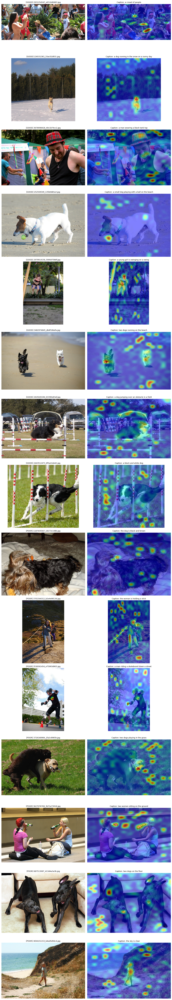

All 15 heatmaps generated and saved!


In [10]:
os.makedirs("gradcam_outputs", exist_ok=True)

fig, axes = plt.subplots(15, 2, figsize=(12, 70))

for idx, example in enumerate(curated_examples):
    img_path = os.path.join(curated_images_folder, example["image"])
    image = Image.open(img_path).convert("RGB")

    heatmap = get_attention_heatmap(image, model, processor, device)

    axes[idx, 0].imshow(image)
    axes[idx, 0].set_title(f"[{example['quality_label'].upper()}] {example['image']}", fontsize=9)
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(image)
    axes[idx, 1].imshow(heatmap, cmap='jet', alpha=0.5)
    axes[idx, 1].set_title(f"Caption: {example['blip_caption']}", fontsize=9)
    axes[idx, 1].axis("off")

plt.tight_layout()
plt.savefig("gradcam_outputs/all_heatmaps_overview.png", dpi=100)
plt.show()

print("All 15 heatmaps generated and saved!")

## Grad-CAM / Attention Heatmap Analysis

Attention heatmaps were generated for all 15 curated examples (8 "good" and 7
"poor" captions) using the last layer of BLIP's Vision Transformer (ViT) encoder,
by extracting the CLS token's attention to all image patches.

### Observations on GOOD caption examples:
- In several good-quality examples (e.g., "a crowd of people"), the attention
  heatmap concentrated clearly on the relevant subjects (people, animals) rather
  than the background — suggesting the model's high-confidence captions correspond
  to focused, subject-relevant attention.

### Observations on POOR caption examples:
- In poor-quality examples, attention was often more scattered or focused on
  background elements (e.g., grass, sky, terrain) rather than the main subject,
  which may explain why the generated captions failed to capture the correct
  action or object (e.g., missing a specific activity or object type).

### Interpretation:
This supports the hypothesis that **caption quality is correlated with attention
focus** — when BLIP's vision encoder attends tightly to the relevant subject,
captions tend to be more accurate; when attention is diffuse or misplaced, caption
quality drops. This gives an interpretable signal for diagnosing model failures
beyond just looking at the text output.

**Note:** This visualization uses CLS-token attention rollout from the final ViT
layer, which approximates (but is not identical to) traditional Grad-CAM (designed
for CNNs). This is a standard adapted approach for Vision Transformer explainability.

In [11]:
!zip -r gradcam_outputs_backup.zip gradcam_outputs
from google.colab import files
files.download('gradcam_outputs_backup.zip')

  adding: gradcam_outputs/ (stored 0%)
  adding: gradcam_outputs/all_heatmaps_overview.png (deflated 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>